In [1]:
#load libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import os
from PIL import Image
import time

In [2]:
#| echo: false

# read_img and display_images functions are from CSE 6040 homework
def read_img(filename):
    img = Image.open(filename)
    img_arr = np.array(img)
    img.close()
    return img_arr

def update_centroids(pixels, cluster_nums, k, d, l_norm):
    updated_centroids = np.full((k, d), np.nan)
    empty_clusters = []
    obj = 0

    for centroid_id in range(k):
        pixel_inds = np.where(cluster_nums == centroid_id)
        cluster_members = pixels[pixel_inds]

        # initial idea was to reintialize clusters with no data points (lecture demo code provided does something similar)
        # after Mark's feedback on Ed, I will just reduce the # of clusters instead
        if len(cluster_members) == 0:
            empty_clusters.append(centroid_id)
            # updated_centroids[centroid_id] = np.random.randint(0, 255, size=(1, 3))
        else:
            updated_centroids[centroid_id] = np.around(np.mean(cluster_members, axis=0)).astype(np.uint8)
            
            #objective function for k-means
            if l_norm == 2:
                dist_metric = np.linalg.norm(cluster_members - updated_centroids[centroid_id], axis=1)
                obj += np.sum(dist_metric ** 2)
            elif l_norm == 1:
                dist_metric = np.sum(np.abs(cluster_members - updated_centroids[centroid_id]), axis=1)
                obj += np.sum(dist_metric)
    
    return updated_centroids, empty_clusters, obj

def check_convergence(obj, prev_obj, iter_count, k):
    if obj == prev_obj:
        print(f"\n\tK = {k} ({iter_count} iterations)")
        return True
    return False

def k_means(pixels, k, l_norm=2):
    m, n, d = pixels.shape
    pixels = np.reshape(pixels, (m*n, d))
    
    if l_norm == 2:
        arg = "euclidean"
    elif l_norm == 1:
        arg = "cityblock"
    
    centroids = np.random.randint(0, 255, size=(k, d))

    iter_count = 0
    prev_obj = -np.inf
    converged = False
    while not converged:
        iter_count += 1

        # using cdist is significantly faster than looping through each pixel to get distance 
        # (credit to Liam ODonnell on Ed)
        dist = cdist(pixels, centroids, arg)
        cluster_nums = np.argmin(dist, axis=1)

        updated_centroids, empty_clusters, obj = update_centroids(pixels, cluster_nums, k, d, l_norm)

        #reduce the number of clusters if there are empty clusters
        if len(empty_clusters) > 0:
            updated_centroids = np.delete(updated_centroids, empty_clusters, 0)
            k -= len(empty_clusters)

        converged = check_convergence(obj, prev_obj, iter_count, k)
        #if not converged, reinitialize variables for another iteration
        prev_obj = obj
        centroids = updated_centroids

    # reassign points to final clusters
    dist = cdist(pixels, centroids, arg)
    cluster_labels = np.argmin(dist, axis=1)
    final_k = k
    return cluster_labels, centroids, iter_count, obj, final_k

def process_images(original_img, labels, centroids, m, n, k, final_k, name, elapsed_time, iter_count):
    compressed_img = centroids[labels].reshape((m, n, -1))
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    
    axs[0].set_title("Original Image")
    axs[0].imshow(original_img)
    axs[0].axis("off")
    
    axs[1].set_title(f"Compressed Image (K = {final_k})")
    axs[1].imshow(compressed_img.astype(np.uint8))
    axs[1].axis("off")
    
    axs[0].text(0.5, -0.05, f"Image name: {name}\nImage dimensions: {m} x {n}", 
                ha = "center", va = "top", transform = axs[0].transAxes, fontsize=12)
    axs[1].text(0.5, -0.05, f"Elapsed time: {elapsed_time:.2f} seconds\nInitial K: {k} | Iterations: {iter_count}", 
                ha = "center", va = "top", transform = axs[1].transAxes, fontsize=12)

    # save the compressed image to a folder
    if not os.path.exists("kmeans_images"):
        os.makedirs("kmeans_images")
    
    # compressed_image_path = os.path.join("kmeans_images", f"{name}_k{k}.jpeg")
    plt.savefig(f"kmeans_images/{name.split('.')[0]}_(k_{k}).jpeg")
    plt.show()

---------------------------------------------
K-Means Clustering
Image: Glockenbronze.png 
Dimensions: 819 x 1024

	K = 2 (10 iterations)
	-> Elapsed time: 0.61 seconds
	-> Class: [0 0 1 ... 0 0 0]
	-> Class size: (838656,)
	-> Centroid matrix size: (2, 3)
	Centroids:
[[138.  99.  87.], [219. 192. 170.]]


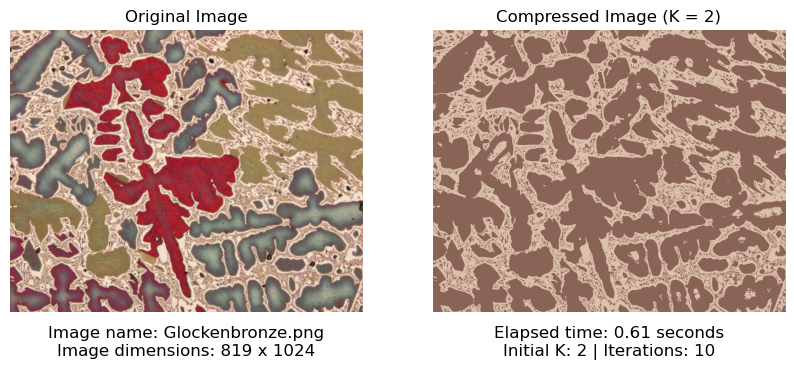


	K = 3 (15 iterations)
	-> Elapsed time: 1.0 seconds
	-> Class: [0 0 1 ... 0 0 0]
	-> Class size: (838656,)
	-> Centroid matrix size: (3, 3)
	Centroids:
[[141. 121. 101.], [223. 197. 174.], [139.  49.  58.]]


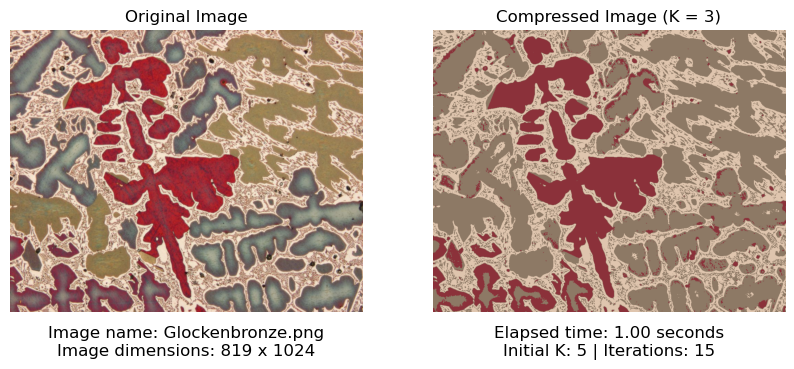


	K = 6 (25 iterations)
	-> Elapsed time: 1.97 seconds
	-> Class: [0 4 4 ... 5 5 0]
	-> Class size: (838656,)
	-> Centroid matrix size: (6, 3)
	Centroids:
[[149. 125.  93.], [210. 179. 157.], [237. 214. 191.], [146.  42.  53.]]
[[173. 148. 128.], [110.  95.  93.]]


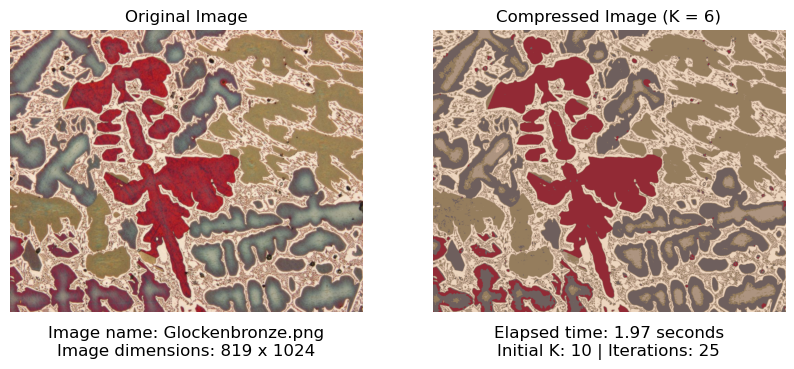


	K = 7 (23 iterations)
	-> Elapsed time: 1.99 seconds
	-> Class: [1 4 5 ... 0 0 1]
	-> Class size: (838656,)
	-> Centroid matrix size: (7, 3)
	Centroids:
[[110.  96.  93.], [155. 125.  91.], [155.  38.  49.], [122.  56.  65.]]
[[133. 135. 124.], [195. 163. 142.], [234. 210. 187.]]


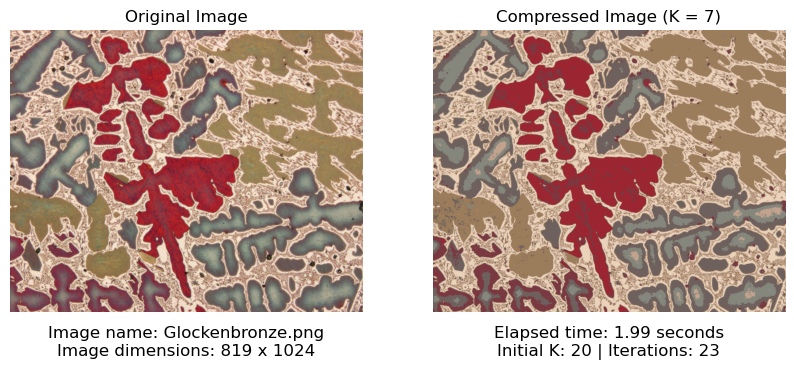


	K = 10 (15 iterations)
	-> Elapsed time: 1.48 seconds
	-> Class: [1 3 8 ... 4 4 6]
	-> Class size: (838656,)
	-> Centroid matrix size: (10, 3)
	Centroids:
[[239. 217. 194.], [124. 127. 118.], [220. 191. 169.], [171. 143. 122.]]
[[109.  94.  91.], [79. 48. 43.], [152. 124.  87.], [127.  57.  67.]]
[[197. 165. 144.], [155.  38.  49.]]


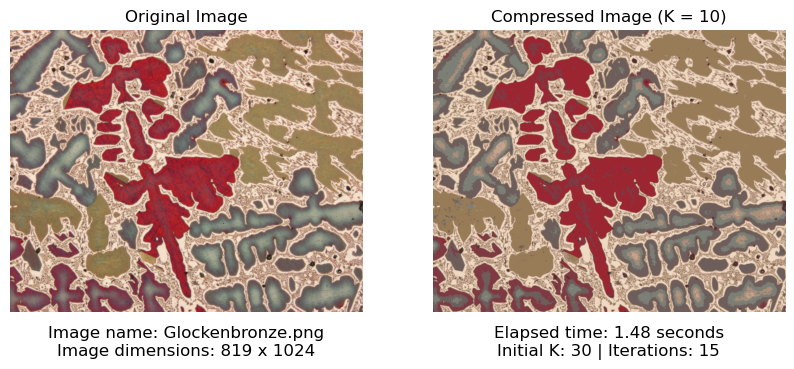

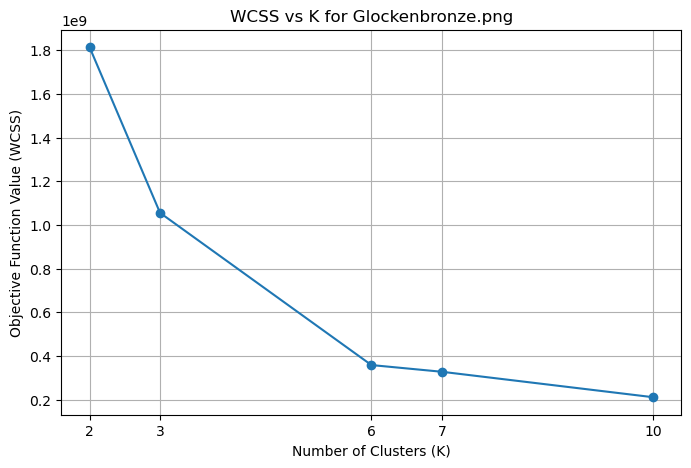

---------------------------------------------
K-Means Clustering
Image: football.bmp 
Dimensions: 412 x 620

	K = 2 (6 iterations)
	-> Elapsed time: 0.12 seconds
	-> Class: [0 0 0 ... 0 0 0]
	-> Class size: (255440,)
	-> Centroid matrix size: (2, 3)
	Centroids:
[[74. 76. 66.], [190. 182. 172.]]


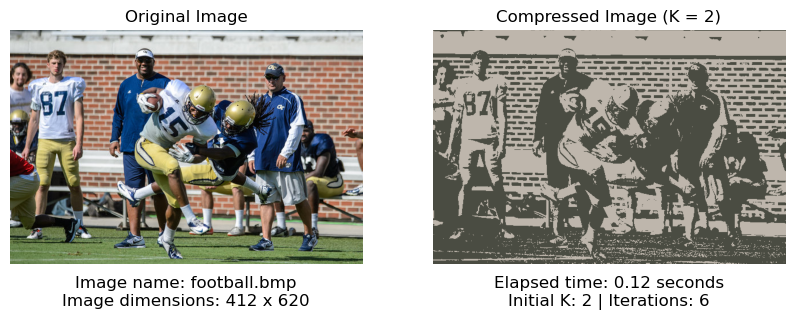


	K = 5 (13 iterations)
	-> Elapsed time: 0.29 seconds
	-> Class: [2 2 2 ... 4 4 4]
	-> Class size: (255440,)
	-> Centroid matrix size: (5, 3)
	Centroids:
[[29. 29. 26.], [214. 219. 222.], [59. 74. 83.], [184. 170. 153.]]
[[133. 123.  95.]]


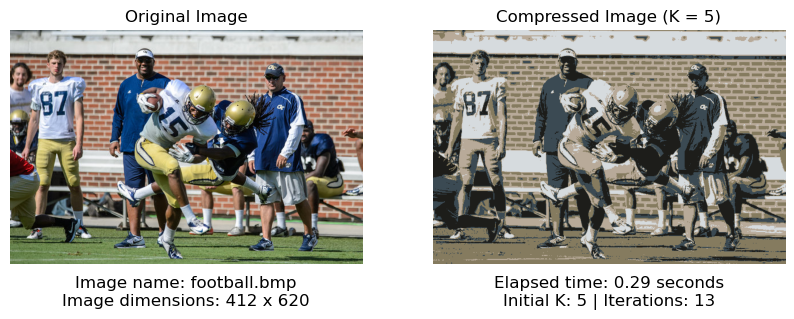


	K = 7 (49 iterations)
	-> Elapsed time: 1.17 seconds
	-> Class: [4 4 4 ... 5 5 5]
	-> Class size: (255440,)
	-> Centroid matrix size: (7, 3)
	Centroids:
[[163. 116.  91.], [ 25.  64. 117.], [214. 219. 223.], [24. 25. 24.]]
[[76. 73. 56.], [114. 130. 103.], [186. 172. 155.]]


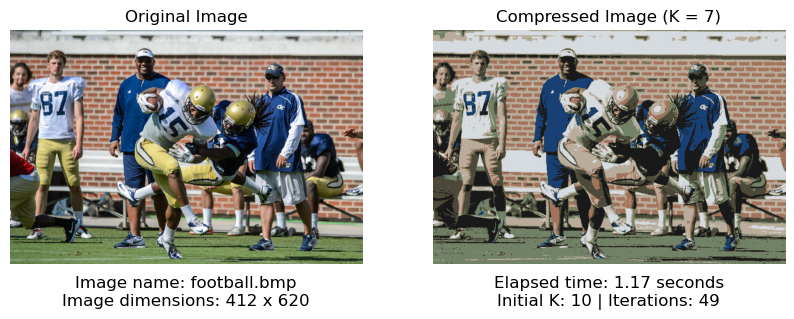


	K = 17 (28 iterations)
	-> Elapsed time: 0.9 seconds
	-> Class: [ 3  3  3 ... 12 12 15]
	-> Class size: (255440,)
	-> Centroid matrix size: (17, 3)
	Centroids:
[[138.  96.  77.], [180. 149. 131.], [189. 179. 106.], [81. 80. 63.]]
[[18. 18. 17.], [16. 39. 73.], [188. 175. 165.], [226. 204. 142.]]
[[130. 142. 156.], [225. 229. 232.], [ 94. 107. 120.], [ 24.  69. 127.]]
[[127. 147.  97.], [168. 114.  90.], [195. 201. 207.], [108. 127.  77.]]
[[54. 50. 34.]]


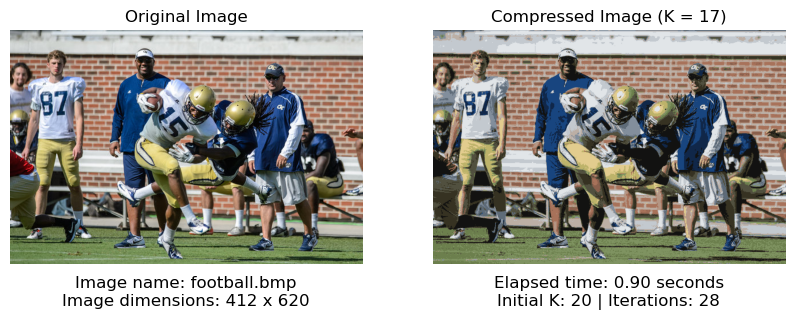


	K = 23 (31 iterations)
	-> Elapsed time: 1.19 seconds
	-> Class: [ 1  1  1 ...  4  4 10]
	-> Class size: (255440,)
	-> Centroid matrix size: (23, 3)
	Centroids:
[[43. 41. 28.], [87. 86. 67.], [173.  26.  33.], [153. 163. 165.]]
[[127. 150.  95.], [ 25.  70. 129.], [137.  97.  78.], [66.  9.  9.]]
[[66. 64. 46.], [128. 129. 128.], [109. 130.  78.], [201. 208. 215.]]
[[227. 231. 233.], [102. 126. 162.], [15. 41. 77.], [168. 111.  87.]]
[[189. 188. 184.], [177. 143. 123.], [14. 16. 17.], [227. 207. 142.]]
[[ 89. 101. 110.], [193. 167. 152.], [192. 181. 107.]]


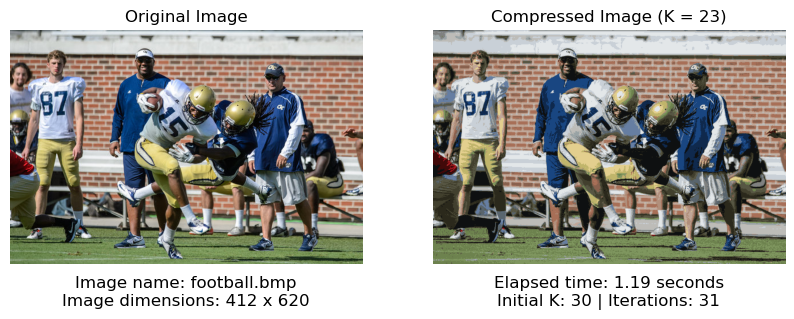

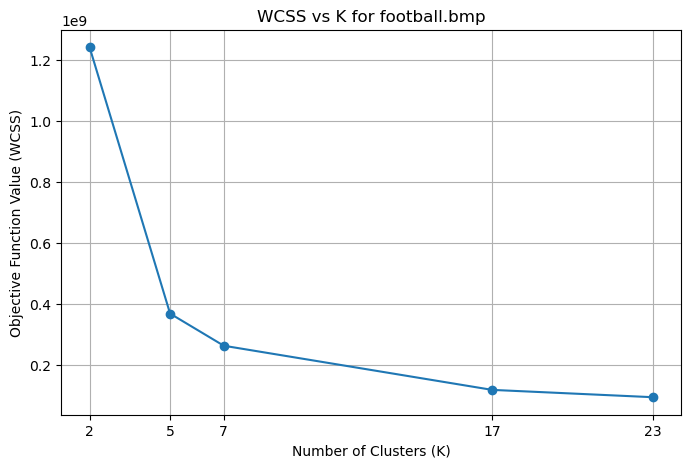

---------------------------------------------
K-Means Clustering
Image: abstract.jpg 
Dimensions: 2000 x 2000

	K = 2 (18 iterations)
	-> Elapsed time: 5.14 seconds
	-> Class: [0 1 1 ... 1 0 0]
	-> Class size: (4000000,)
	-> Centroid matrix size: (2, 3)
	Centroids:
[[214. 135. 101.], [ 78.  52. 120.]]


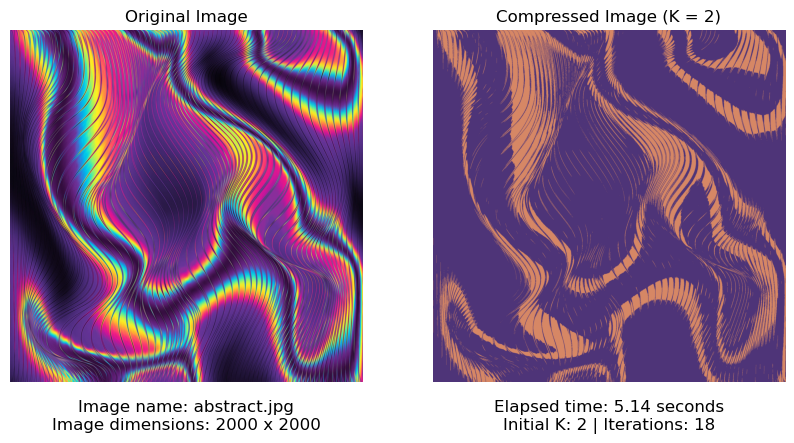


	K = 4 (15 iterations)
	-> Elapsed time: 4.81 seconds
	-> Class: [0 0 0 ... 0 0 2]
	-> Class size: (4000000,)
	-> Centroid matrix size: (4, 3)
	Centroids:
[[127.  52. 141.], [ 57. 180. 193.], [230. 174.  74.], [51. 25. 75.]]


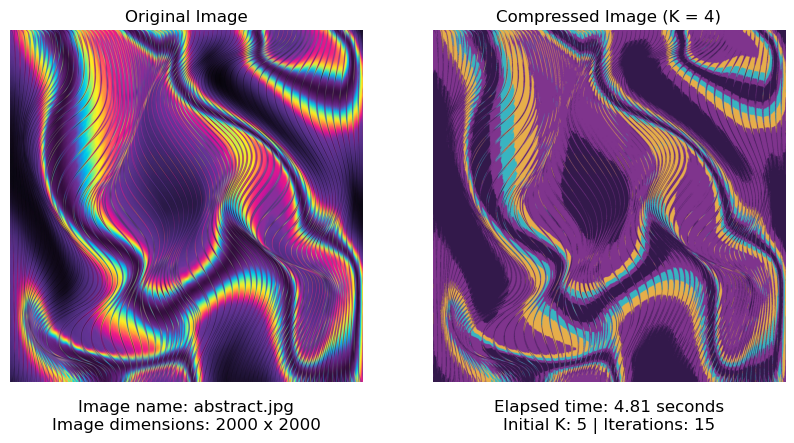


	K = 10 (38 iterations)
	-> Elapsed time: 16.53 seconds
	-> Class: [6 5 3 ... 5 6 7]
	-> Class size: (4000000,)
	-> Centroid matrix size: (10, 3)
	Centroids:
[[135. 220. 128.], [ 32. 190. 212.], [236. 217.  52.], [ 94.  51. 137.]]
[[ 80. 111. 179.], [145.  57. 147.], [221.  37. 137.], [242. 118.  87.]]
[[26. 13. 41.], [63. 30. 90.]]


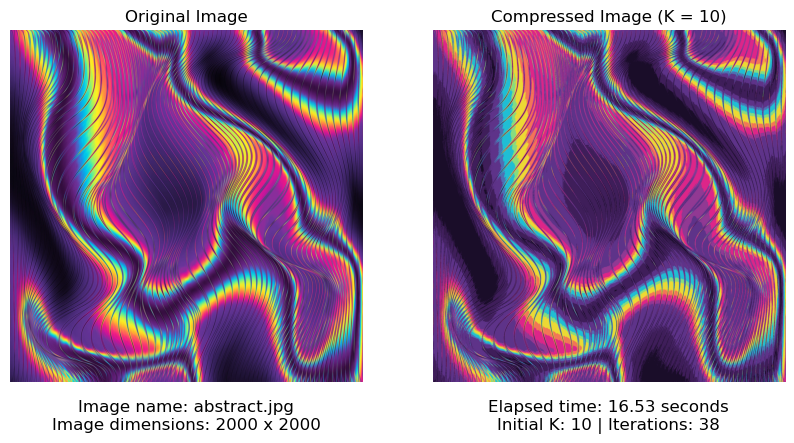


	K = 18 (32 iterations)
	-> Elapsed time: 18.22 seconds
	-> Class: [17  5  1 ...  5  5  3]
	-> Class size: (4000000,)
	-> Centroid matrix size: (18, 3)
	Centroids:
[[195. 234.  80.], [105.  52. 150.], [ 17. 191. 224.], [249. 116.  84.]]
[[121.  84. 127.], [160.  41. 151.], [ 48. 137. 207.], [48. 21. 69.]]
[[121. 143. 147.], [18. 10. 31.], [ 80.  91. 177.], [ 69. 220. 179.]]
[[184. 124. 113.], [133. 231. 128.], [ 86.  45. 127.], [69. 34. 99.]]
[[246. 211.  46.], [227.  38. 134.]]


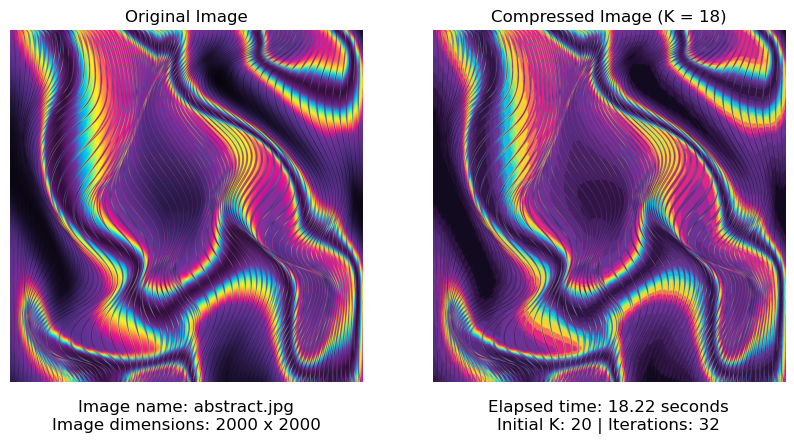


	K = 27 (45 iterations)
	-> Elapsed time: 31.57 seconds
	-> Class: [15  8 17 ... 15 15  2]
	-> Class size: (4000000,)
	-> Centroid matrix size: (27, 3)
	Centroids:
[[ 14. 186. 227.], [ 88. 222. 164.], [246.  80. 104.], [ 80.  92. 178.]]
[[112.  81. 125.], [212. 236.  66.], [ 75.  45. 120.], [17.  9. 28.]]
[[134.  48. 153.], [ 92.  33. 112.], [248. 117.  84.], [240.  45. 125.]]
[[62. 29. 88.], [ 48. 137. 207.], [122. 133. 147.], [176.  34. 151.]]
[[ 45. 215. 198.], [ 98.  51. 146.], [131. 231. 129.], [43. 19. 63.]]
[[249. 154.  66.], [181. 157. 110.], [249. 192.  49.], [218.  26. 144.]]
[[246. 231.  39.], [172.  87. 125.], [173. 236.  96.]]


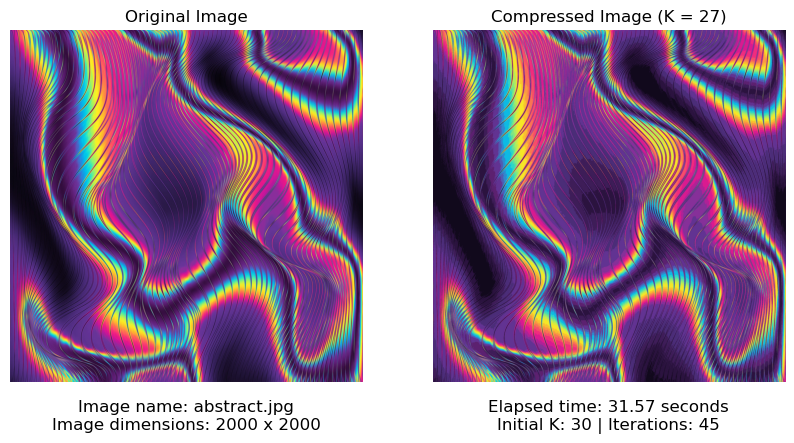

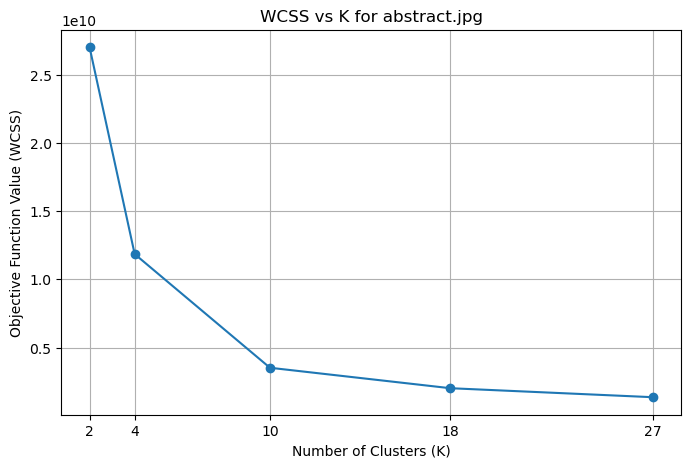

---------------------------------------------
K-Means Clustering
Image: starry_night.jpg 
Dimensions: 1200 x 1920

	K = 2 (13 iterations)
	-> Elapsed time: 2.18 seconds
	-> Class: [0 0 0 ... 0 0 0]
	-> Class size: (2304000,)
	-> Centroid matrix size: (2, 3)
	Centroids:
[[26. 58. 94.], [168. 208. 191.]]


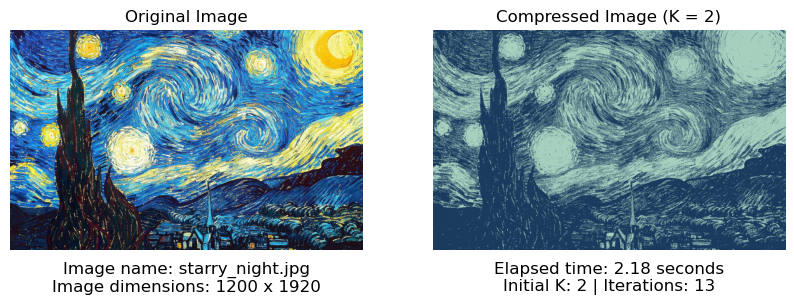


	K = 5 (27 iterations)
	-> Elapsed time: 5.46 seconds
	-> Class: [0 0 3 ... 0 0 0]
	-> Class size: (2304000,)
	-> Centroid matrix size: (5, 3)
	Centroids:
[[21. 28. 47.], [219. 242. 214.], [ 84. 168. 214.], [ 30.  88. 144.]]
[[210. 204. 100.]]


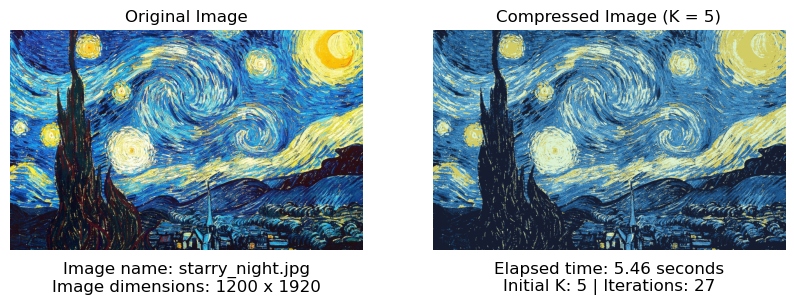


	K = 10 (44 iterations)
	-> Elapsed time: 11.21 seconds
	-> Class: [1 1 1 ... 3 3 3]
	-> Class size: (2304000,)
	-> Centroid matrix size: (10, 3)
	Centroids:
[[150. 176. 157.], [16. 49. 97.], [113. 203. 240.], [20. 21. 35.]]
[[ 92. 106.  91.], [222. 246. 230.], [ 56. 142. 203.], [239. 239. 152.]]
[[220. 199.  56.], [ 24.  91. 156.]]


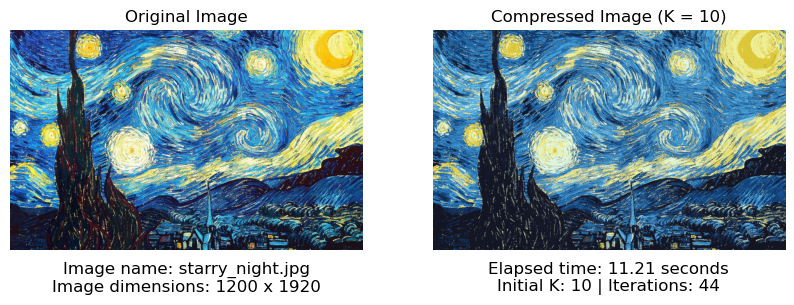


	K = 19 (58 iterations)
	-> Elapsed time: 20.46 seconds
	-> Class: [17 17  1 ... 16 16 10]
	-> Class size: (2304000,)
	-> Centroid matrix size: (19, 3)
	Centroids:
[[241. 237. 127.], [ 12.  65. 130.], [ 45. 139. 206.], [126. 151. 138.]]
[[ 86. 189. 242.], [ 18. 100. 171.], [149. 228. 246.], [177. 204. 183.]]
[[49. 73. 95.], [115. 115.  61.], [13. 14. 28.], [ 62. 110. 152.]]
[[ 97. 161. 200.], [227. 249. 240.], [187. 188. 101.], [244. 247. 188.]]
[[40. 35. 44.], [ 8. 36. 82.], [235. 200.  32.]]


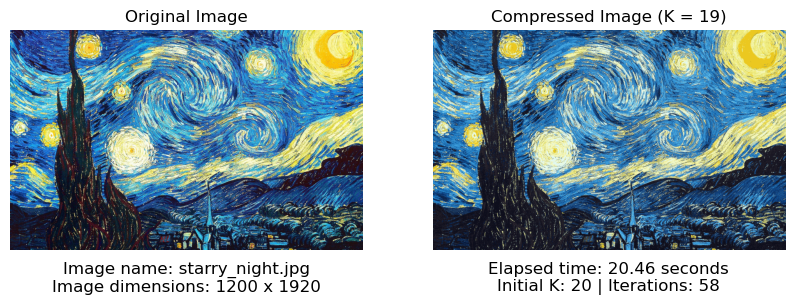


	K = 23 (29 iterations)
	-> Elapsed time: 11.31 seconds
	-> Class: [10 10  3 ... 21 21  6]
	-> Class size: (2304000,)
	-> Centroid matrix size: (23, 3)
	Centroids:
[[47. 34. 38.], [231. 250. 237.], [244. 247. 183.], [ 11.  70. 138.]]
[[139. 134.  43.], [240. 201.  30.], [14. 12. 22.], [ 92. 193. 244.]]
[[193. 191.  88.], [ 17. 107. 178.], [ 6. 42. 99.], [ 52. 153. 218.]]
[[ 62. 126. 184.], [181. 214. 202.], [153. 232. 249.], [178. 192. 150.]]
[[241. 237. 124.], [83. 95. 84.], [ 49.  95. 143.], [37. 61. 88.]]
[[112. 171. 197.], [12. 27. 54.], [118. 143. 132.]]


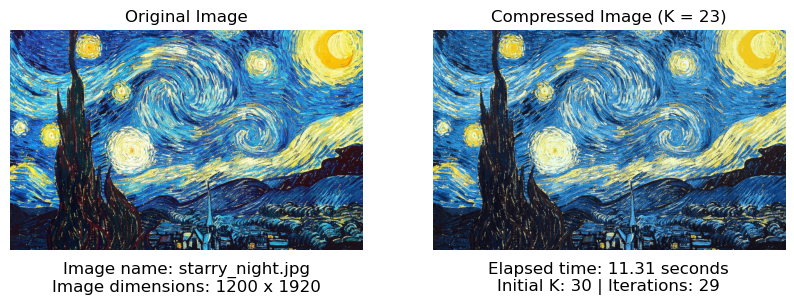

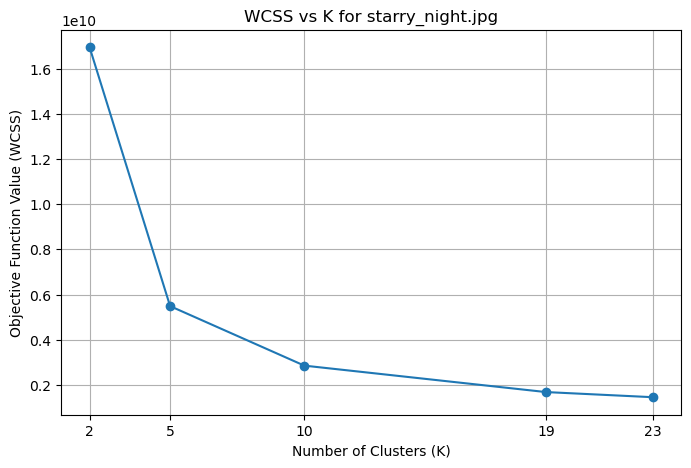

---------------------------------------------
K-Means Clustering
Image: doggo.png 
Dimensions: 1180 x 880

	K = 2 (12 iterations)
	-> Elapsed time: 0.92 seconds
	-> Class: [0 0 0 ... 0 0 0]
	-> Class size: (1038400,)
	-> Centroid matrix size: (2, 3)
	Centroids:
[[22. 35. 25.], [127. 139. 103.]]


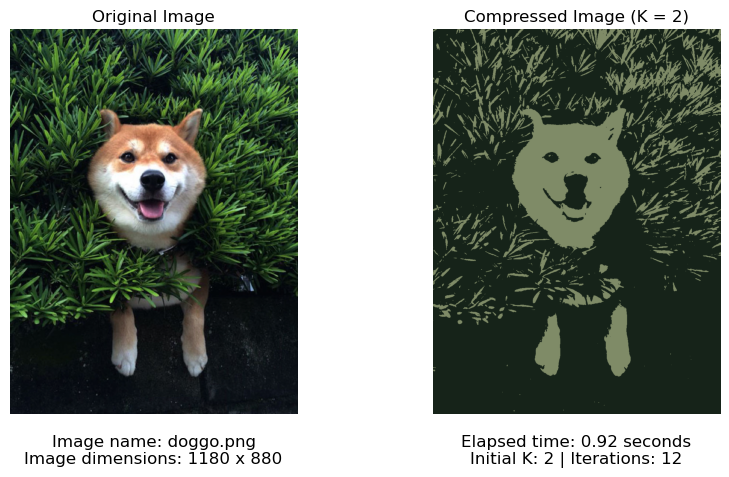


	K = 5 (21 iterations)
	-> Elapsed time: 1.85 seconds
	-> Class: [3 3 3 ... 3 3 3]
	-> Class size: (1038400,)
	-> Centroid matrix size: (5, 3)
	Centroids:
[[168. 148. 129.], [44. 68. 40.], [226. 223. 219.], [12. 21. 18.]]
[[ 90. 120.  71.]]


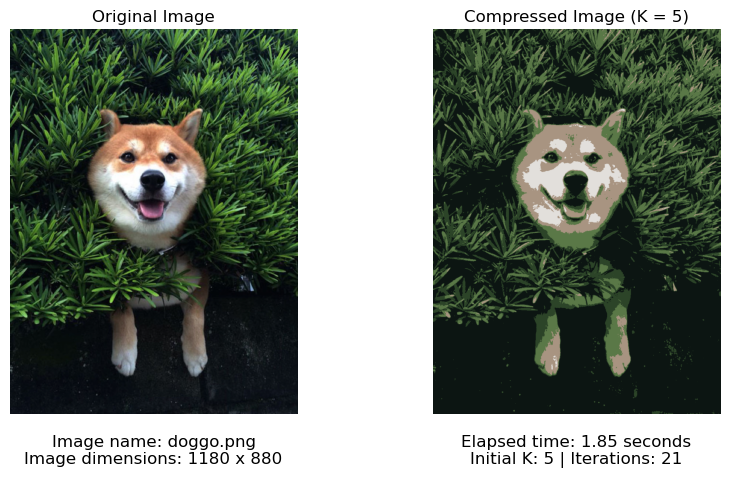


	K = 7 (35 iterations)
	-> Elapsed time: 3.41 seconds
	-> Class: [0 0 3 ... 0 0 0]
	-> Class size: (1038400,)
	-> Centroid matrix size: (7, 3)
	Centroids:
[[11. 19. 17.], [182. 158. 140.], [ 94. 141.  67.], [33. 54. 32.]]
[[63. 90. 54.], [121. 113. 101.], [231. 229. 226.]]


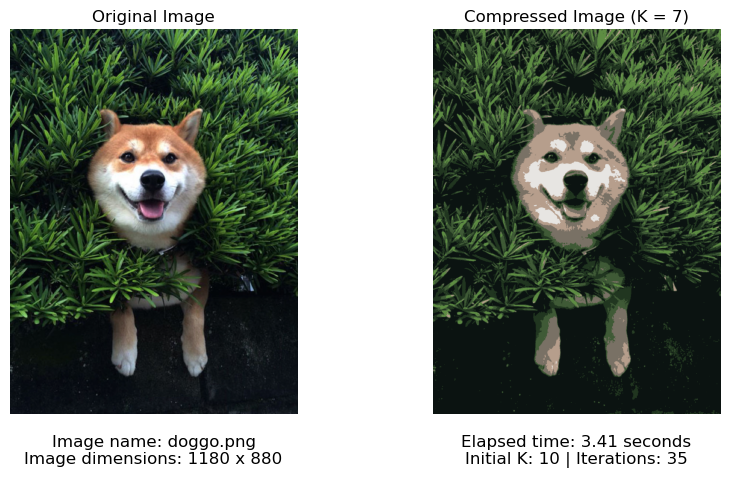


	K = 14 (46 iterations)
	-> Elapsed time: 5.7 seconds
	-> Class: [8 3 3 ... 3 3 3]
	-> Class size: (1038400,)
	-> Centroid matrix size: (14, 3)
	Centroids:
[[177. 184. 185.], [154. 114.  93.], [50. 79. 43.], [18. 30. 24.]]
[[237. 190. 158.], [100. 107.  92.], [33. 54. 32.], [104. 155.  72.]]
[[ 8. 15. 15.], [206. 147. 115.], [138. 146. 137.], [ 76. 119.  53.]]
[[239. 241. 239.], [70. 85. 67.]]


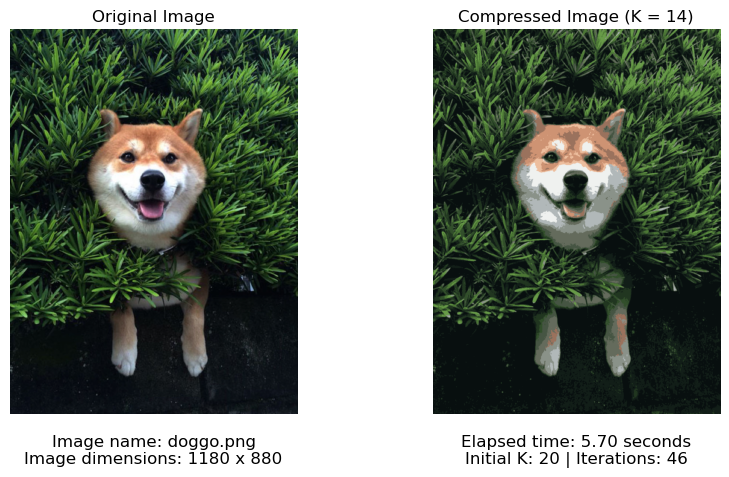


	K = 20 (59 iterations)
	-> Elapsed time: 8.41 seconds
	-> Class: [10 10 10 ... 10 10 10]
	-> Class size: (1038400,)
	-> Centroid matrix size: (20, 3)
	Centroids:
[[59. 71. 59.], [45. 76. 38.], [ 66. 104.  50.], [191. 135. 104.]]
[[110. 116. 101.], [88. 95. 81.], [217. 157. 122.], [239. 192. 160.]]
[[167. 107. 139.], [155. 108.  82.], [17. 29. 23.], [249. 250. 248.]]
[[31. 51. 31.], [134. 138. 131.], [181. 187. 190.], [112. 165.  78.]]
[[155. 162. 159.], [ 8. 14. 15.], [ 88. 134.  61.], [219. 220. 218.]]


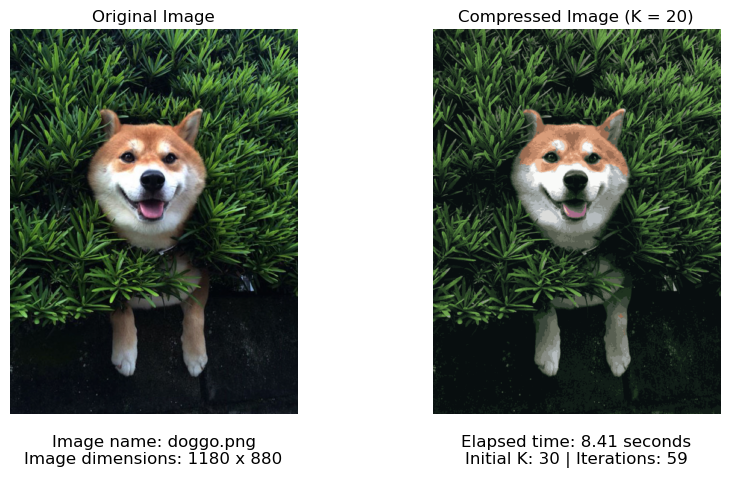

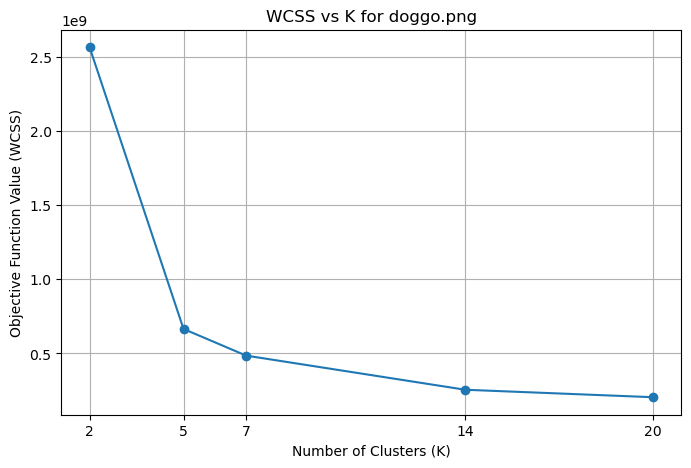

---------------------------------------------
K-Means Clustering
Image: gt_bee.jpg 
Dimensions: 813 x 1220

	K = 2 (11 iterations)
	-> Elapsed time: 0.81 seconds
	-> Class: [0 0 0 ... 0 0 0]
	-> Class size: (991860,)
	-> Centroid matrix size: (2, 3)
	Centroids:
[[55. 42. 32.], [149. 130. 111.]]


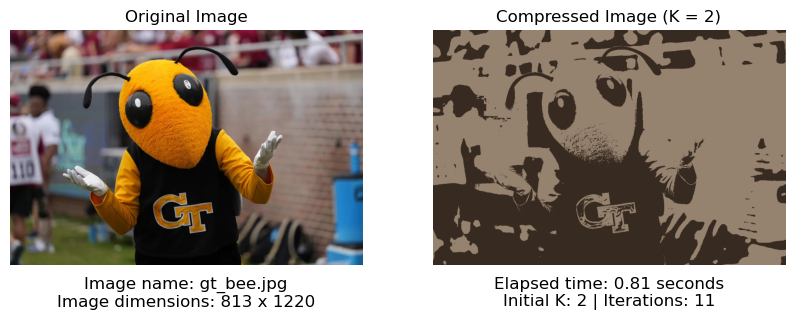


	K = 4 (27 iterations)
	-> Elapsed time: 2.09 seconds
	-> Class: [0 0 0 ... 0 0 0]
	-> Class size: (991860,)
	-> Centroid matrix size: (4, 3)
	Centroids:
[[96. 81. 73.], [149. 143. 145.], [25. 18. 15.], [209. 129.  10.]]


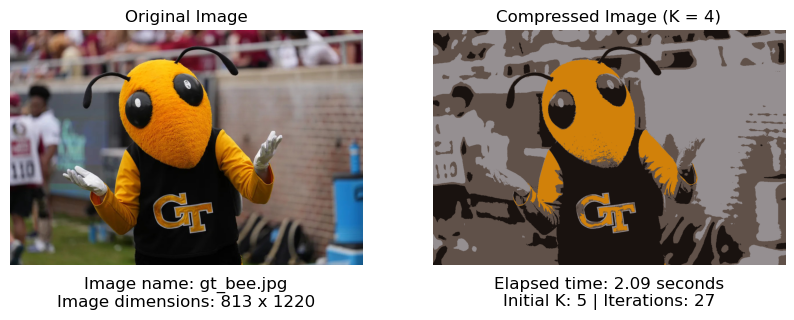


	K = 8 (28 iterations)
	-> Elapsed time: 2.62 seconds
	-> Class: [5 5 5 ... 2 2 2]
	-> Class size: (991860,)
	-> Centroid matrix size: (8, 3)
	Centroids:
[[14. 13. 12.], [148. 135. 131.], [ 42. 120. 178.], [236. 156.  14.]]
[[181. 177. 183.], [78. 59. 43.], [170.  92.   7.], [107.  93.  92.]]


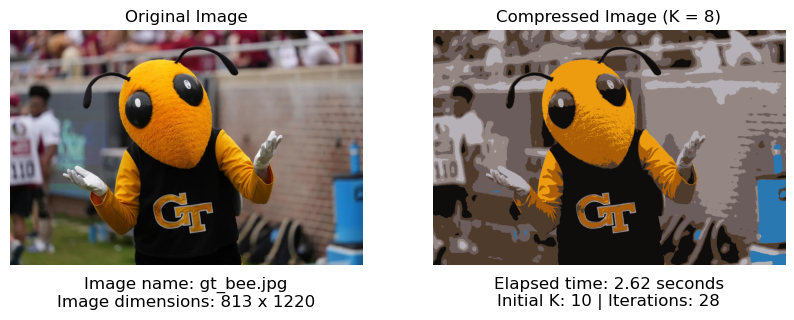


	K = 13 (43 iterations)
	-> Elapsed time: 4.75 seconds
	-> Class: [1 1 1 ... 2 2 2]
	-> Class size: (991860,)
	-> Centroid matrix size: (13, 3)
	Centroids:
[[200. 198. 210.], [88. 75. 56.], [ 41. 123. 182.], [163.  87.   6.]]
[[144. 129. 124.], [124.  99.  92.], [216. 125.   8.], [162. 155. 155.]]
[[247. 178.  19.], [11. 10. 10.], [100.  41.  17.], [81. 89. 99.]]
[[53. 42. 38.]]


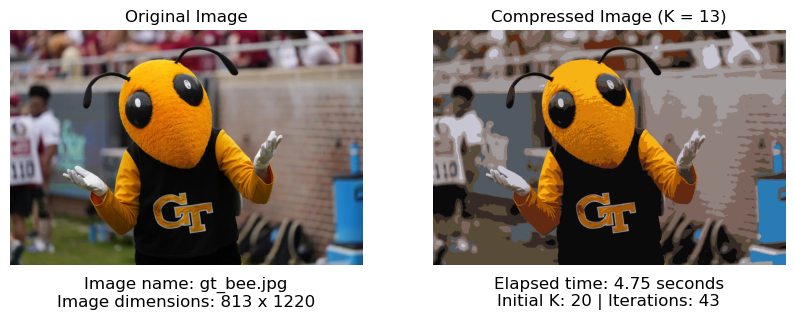


	K = 21 (32 iterations)
	-> Elapsed time: 4.45 seconds
	-> Class: [13  2  2 ... 12 12  3]
	-> Class size: (991860,)
	-> Centroid matrix size: (21, 3)
	Centroids:
[[86. 90. 41.], [10. 10.  9.], [73. 59. 56.], [ 38.  75. 106.]]
[[ 41. 129. 192.], [45. 34. 30.], [247. 178.  19.], [163.  87.   6.]]
[[210. 209. 220.], [84. 89. 98.], [161. 116.  93.], [216. 125.   7.]]
[[ 32. 105. 161.], [110.  81.  75.], [148. 131. 126.], [100.  41.  16.]]
[[130. 107. 100.], [163. 152. 150.], [112. 117. 126.], [111. 151. 163.]]
[[177. 173. 181.]]


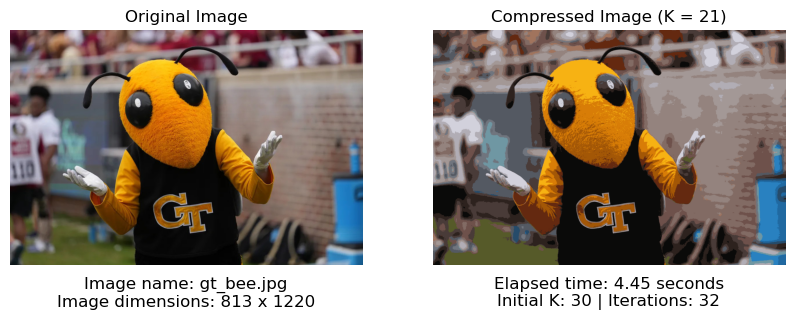

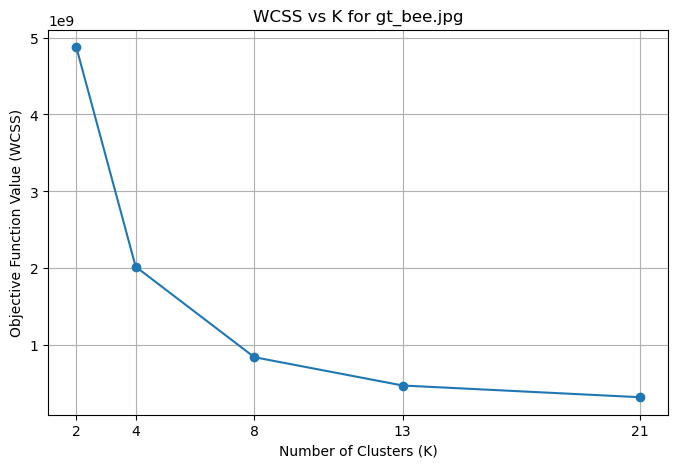

In [3]:
#| echo: false

# random seed to ensure reproducibility 
np.random.seed(12192000)

k_values = [2, 5, 10, 20, 30]
img_list = ["Glockenbronze.png", "football.bmp", "abstract.jpg", "starry_night.jpg", "doggo.png", "gt_bee.jpg"]

for image in img_list:
    img_arr = read_img(f"data\{image}")
    m, n, d = img_arr.shape
    print("-"*45)
    print(f"K-Means Clustering\nImage: {image} \nDimensions: {m} x {n}")
    
    obj_values = []
    final_k_values = []

    for k_val in k_values:
        start_time = time.time()
        labels, centroids, iter_count, obj, final_k = k_means (img_arr, k_val, l_norm=2)
        end_time = time.time()
        elapsed_time = end_time - start_time
        obj_values.append(obj)
        final_k_values.append(final_k)
        print("\t-> Elapsed time:", round(elapsed_time, 2), "seconds")
        print("\t-> Class:", labels)
        print("\t-> Class size:", labels.shape)
        print("\t-> Centroid matrix size:", centroids.shape)
        print("\tCentroids:")
        for i in range(0, len(centroids), 4):
            print(f"[{', '.join(f'{x}' for x in centroids[i:i+4])}]")
        
        process_images(img_arr, labels, centroids, m, n, k_val, final_k, image, elapsed_time, iter_count)

    # plots the obj values vs k values to find optimial k 
    plt.figure(figsize=(8, 5))
    plt.plot(final_k_values, obj_values, marker = "o")
    plt.xticks(final_k_values)
    plt.xlabel("Number of Clusters (K)")
    plt.ylabel("Objective Function Value (WCSS)")
    plt.title(f"WCSS vs K for {image}")
    plt.grid(True)
    plt.savefig(os.path.join("kmeans_images", f"{image.split('.')[0]}_wcss_vs_k.png"))
    plt.show()